<a href="https://colab.research.google.com/github/swarajgadgul/Chennai_House_Price_Prediction/blob/main/Chennai_house_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [302]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt



%matplotlib inline
plt.rcParams['figure.figsize'] = (17,9)
plt.rcParams['font.size'] = 11
pd.set_option("display.max_rows", None, "display.max_columns", None)
plt.rcParams['figure.dpi'] = 70
sns.set_style('darkgrid')
import warnings
warnings.filterwarnings("ignore")


# Problem statement
Real estate transactions are quite opaque sometimes and it
may be difficult for a newbie to know the fair price of any given
home. Thus, multiple real estate websites have the functionality
to predict the prices of houses given different features
regarding it. Such forecasting models will help buyers to identify
a fair price for the home and also give insights to sellers as to
how to build homes that fetch them more money. Chennai
house sale price data is shared here and the participants are
expected to build a sale price prediction model that will aid the
customers to find a fair price for their homes and also help the
sellers understand what factors are fetching more money
for the houses?


understanding Attributes in the data:
PART_Id: Id of the particular house i.e. Project ID

AREA: The area where house is situated

INT_SQFT: Total area of the house in square feet.

DATE_SALE: The date in which the house got sold

DIST_MAINROAD: How many meters the house is far from main road

N_BEDROOM: Total Number of Bedrooms

N_BATHROOM: Total Number of bathrooms

SALE_COND: Types of sale

PARK_FACIL: Parking facility

DATE_BUILD: The date in which the house was built

BUILDTYPE: What type of building it is i.e. residential or commercial

UTILITY_AVAIL: What are the public facilities are available

STREET: Type of street(road) the house is situated

MZZONE: What zone the house belongs to. (There are currently 13 zones in Chennai)

QS_ROOMS: Masked rooms

QS_BATHROOM: Masked bathrooms

QS_BEDROOM: Masked bedroomU

QS_OVERALL:

REG_FEE: Total registration fee offered to register the house

COMMIS: Total commission payed

SALES_PRICE: Sale price of the house


### Loading Dataset

In [303]:
data = pd.read_csv("chennai.csv")
data.head()

,PRT_ID,AREA,INT_SQFT,DATE_SALE,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,DATE_BUILD,BUILDTYPE,UTILITY_AVAIL,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,REG_FEE,COMMIS,SALES_PRICE
0,P03210,Karapakkam,1004,04-05-2011,131,1.0,1.0,3,AbNormal,Yes,15-05-1967,Commercial,AllPub,Paved,A,4.0,3.9,4.9,4.330,380000,144400,7600000
1,P09411,Anna Nagar,1986,19-12-2006,26,2.0,1.0,5,AbNormal,No,22-12-1995,Commercial,AllPub,Gravel,RH,4.9,4.2,2.5,3.765,760122,304049,21717770
2,P01812,Adyar,909,04-02-2012,70,1.0,1.0,3,AbNormal,Yes,09-02-1992,Commercial,ELO,Gravel,RL,4.1,3.8,2.2,3.090,421094,92114,13159200
3,P05346,Velachery,1855,13-03-2010,14,3.0,2.0,5,Family,No,18-03-1988,Others,NoSewr,Paved,I,4.7,3.9,3.6,4.010,356321,77042,9630290
4,P06210,Karapakkam,1226,05-10-2009,84,1.0,1.0,3,AbNormal,Yes,13-10-1979,Others,AllPub,Gravel,C,3.0,2.5,4.1,3.290,237000,74063,7406250


### Getting information about data

In [304]:
data.columns

Index(['PRT_ID', 'AREA', 'INT_SQFT', 'DATE_SALE', 'DIST_MAINROAD', 'N_BEDROOM',
       'N_BATHROOM', 'N_ROOM', 'SALE_COND', 'PARK_FACIL', 'DATE_BUILD',
       'BUILDTYPE', 'UTILITY_AVAIL', 'STREET', 'MZZONE', 'QS_ROOMS',
       'QS_BATHROOM', 'QS_BEDROOM', 'QS_OVERALL', 'REG_FEE', 'COMMIS',
       'SALES_PRICE'],
      dtype='object')

In [305]:
data.shape

(7109, 22)

In [306]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7109 entries, 0 to 7108
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   PRT_ID         7109 non-null   object 
 1   AREA           7109 non-null   object 
 2   INT_SQFT       7109 non-null   int64  
 3   DATE_SALE      7109 non-null   object 
 4   DIST_MAINROAD  7109 non-null   int64  
 5   N_BEDROOM      7108 non-null   float64
 6   N_BATHROOM     7104 non-null   float64
 7   N_ROOM         7109 non-null   int64  
 8   SALE_COND      7109 non-null   object 
 9   PARK_FACIL     7109 non-null   object 
 10  DATE_BUILD     7109 non-null   object 
 11  BUILDTYPE      7109 non-null   object 
 12  UTILITY_AVAIL  7109 non-null   object 
 13  STREET         7109 non-null   object 
 14  MZZONE         7109 non-null   object 
 15  QS_ROOMS       7109 non-null   float64
 16  QS_BATHROOM    7109 non-null   float64
 17  QS_BEDROOM     7109 non-null   float64
 18  QS_OVERA

In [307]:
data.describe()

,INT_SQFT,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,REG_FEE,COMMIS,SALES_PRICE
count,7109.000000,7109.000000,7108.000000,7104.000000,7109.000000,7109.000000,7109.000000,7109.000000,7061.000000,7109.000000,7109.000000,7.109000e+03
mean,1382.073006,99.603179,1.637029,1.213260,3.688704,3.517471,3.507244,3.485300,3.503254,376938.330708,141005.726544,1.089491e+07
std,457.410902,57.403110,0.802902,0.409639,1.019099,0.891972,0.897834,0.887266,0.527223,143070.662010,78768.093718,3.768603e+06
min,500.000000,0.000000,1.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,71177.000000,5055.000000,2.156875e+06
25%,993.000000,50.000000,1.000000,1.000000,3.000000,2.700000,2.700000,2.700000,3.130000,272406.000000,84219.000000,8.272100e+06
50%,1373.000000,99.000000,1.000000,1.000000,4.000000,3.500000,3.500000,3.500000,3.500000,349486.000000,127628.000000,1.033505e+07
75%,1744.000000,148.000000,2.000000,1.000000,4.000000,4.300000,4.300000,4.300000,3.890000,451562.000000,184506.000000,1.299390e+07
max,2500.000000,200.000000,4.000000,2.000000,6.000000,5.000000,5.000000,5.000000,4.970000,983922.000000,495405.000000,2.366734e+07



## Data cleaning

##### Checking and filling null values

In [308]:
#checking null values
data.isnull().sum()

PRT_ID            0
AREA              0
INT_SQFT          0
DATE_SALE         0
DIST_MAINROAD     0
N_BEDROOM         1
N_BATHROOM        5
N_ROOM            0
SALE_COND         0
PARK_FACIL        0
DATE_BUILD        0
BUILDTYPE         0
UTILITY_AVAIL     0
STREET            0
MZZONE            0
QS_ROOMS          0
QS_BATHROOM       0
QS_BEDROOM        0
QS_OVERALL       48
REG_FEE           0
COMMIS            0
SALES_PRICE       0
dtype: int64

In [309]:
data.isnull().sum()/data.shape[0]*100

PRT_ID           0.000000
AREA             0.000000
INT_SQFT         0.000000
DATE_SALE        0.000000
DIST_MAINROAD    0.000000
N_BEDROOM        0.014067
N_BATHROOM       0.070333
N_ROOM           0.000000
SALE_COND        0.000000
PARK_FACIL       0.000000
DATE_BUILD       0.000000
BUILDTYPE        0.000000
UTILITY_AVAIL    0.000000
STREET           0.000000
MZZONE           0.000000
QS_ROOMS         0.000000
QS_BATHROOM      0.000000
QS_BEDROOM       0.000000
QS_OVERALL       0.675200
REG_FEE          0.000000
COMMIS           0.000000
SALES_PRICE      0.000000
dtype: float64


##### so we can see there are missing values in only three columns : N_beroom- 0.014% , N_bathroom:-0.07% and Qs overall :- 0.67%

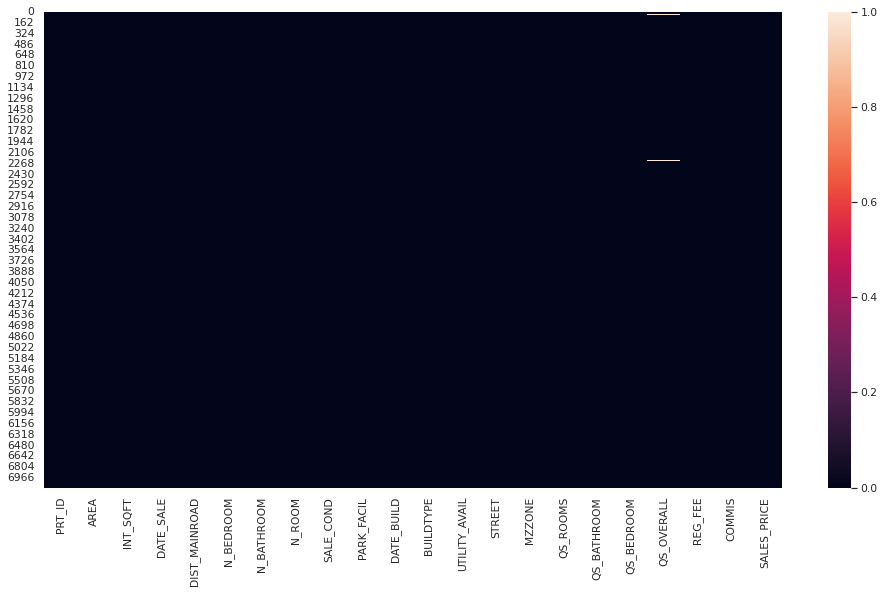

In [310]:
sns.heatmap(data.isnull())
plt.show()
#visualising missing values

#### filling missing values

In [311]:
print(data.N_BATHROOM.isnull().sum())

5


In [312]:
print("mode:",data.N_BATHROOM.mode())
print("mean:",data.N_BATHROOM.mean())

mode: 0    1.0
dtype: float64
mean: 1.213260135135135


In [313]:
data.N_BATHROOM.fillna(1,inplace = True)

we are filling the missing values in N_bthroom columns as 1 because the mean is 1.21 and no of bathroom cant be 1.21 so we will fill with median

In [314]:
data.N_BATHROOM.isnull().sum()

0

In [315]:
data.N_BEDROOM.isnull().sum()

1

In [316]:
data.N_BEDROOM.fillna(1, inplace = True)

In [317]:
data.QS_OVERALL.isnull().sum()

48

In [318]:
data.QS_OVERALL.mean()

3.5032537884152344

In [319]:
data.QS_OVERALL.fillna(3.50, inplace = True)

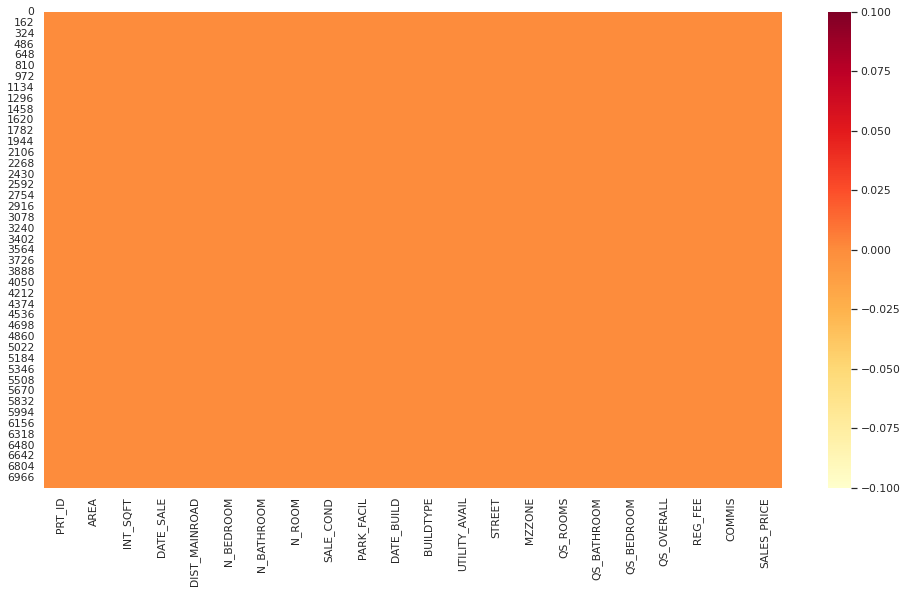

In [320]:
sns.heatmap(data.isnull(),cmap = "YlOrRd")
plt.show()


##### as we can see our data frame is free from null values

### Finding spelling mistakes

#### find catagorical and numerical columns

In [321]:
cat_col = data.select_dtypes("object")

In [322]:
num_col = data.select_dtypes(exclude=['object'])

In [323]:
num_col.head()

,INT_SQFT,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,REG_FEE,COMMIS,SALES_PRICE
0,1004,131,1.0,1.0,3,4.0,3.9,4.9,4.330,380000,144400,7600000
1,1986,26,2.0,1.0,5,4.9,4.2,2.5,3.765,760122,304049,21717770
2,909,70,1.0,1.0,3,4.1,3.8,2.2,3.090,421094,92114,13159200
3,1855,14,3.0,2.0,5,4.7,3.9,3.6,4.010,356321,77042,9630290
4,1226,84,1.0,1.0,3,3.0,2.5,4.1,3.290,237000,74063,7406250


In [324]:
cat_col.head()

,PRT_ID,AREA,DATE_SALE,SALE_COND,PARK_FACIL,DATE_BUILD,BUILDTYPE,UTILITY_AVAIL,STREET,MZZONE
0,P03210,Karapakkam,04-05-2011,AbNormal,Yes,15-05-1967,Commercial,AllPub,Paved,A
1,P09411,Anna Nagar,19-12-2006,AbNormal,No,22-12-1995,Commercial,AllPub,Gravel,RH
2,P01812,Adyar,04-02-2012,AbNormal,Yes,09-02-1992,Commercial,ELO,Gravel,RL
3,P05346,Velachery,13-03-2010,Family,No,18-03-1988,Others,NoSewr,Paved,I
4,P06210,Karapakkam,05-10-2009,AbNormal,Yes,13-10-1979,Others,AllPub,Gravel,C


In [325]:
cat_col.shape

(7109, 10)

In [326]:
cat_col.AREA.value_counts()

Chrompet      1681
Karapakkam    1363
KK Nagar       996
Velachery      979
Anna Nagar     783
Adyar          773
T Nagar        496
Chrompt          9
Chrmpet          6
Chormpet         6
TNagar           5
Karapakam        3
Ana Nagar        3
Velchery         2
Ann Nagar        2
Adyr             1
KKNagar          1
Name: AREA, dtype: int64

#### correcting speliings of catogoricals values

In [327]:
new_area = {
    "Chrompt":"Chrompet",
    "Chrmpet":"Chrompet",
    "Chrmpet" :"Chrompet",
    "Chormpet":"Chrompet",
    "TNagar":"T Nagar",
    "Ana Nagar":"Anna Nagar",
    "Ann Nagar":"Anna Nagar",
    "Karapakam":"Karapakkam",
    "Velchery":"Velachery",
    "KKNagar":"KK Nagar",
    "Adyr":"Adyar",
    "Adayar":"Adyar"
    
}

In [328]:
data['AREA'] = data.AREA.replace(new_area)

In [329]:
data.AREA.value_counts()


Chrompet      1702
Karapakkam    1366
KK Nagar       997
Velachery      981
Anna Nagar     788
Adyar          774
T Nagar        501
Name: AREA, dtype: int64

In [330]:
cat_col.SALE_COND.value_counts()

AdjLand        1433
Partial        1429
Normal Sale    1423
AbNormal       1406
Family         1403
Adj Land          6
Ab Normal         5
Partiall          3
PartiaLl          1
Name: SALE_COND, dtype: int64

In [331]:
sl_cd = {
    "Adj Land":"AdjLand",
    "Ab Normal":"AbNormal",
    "Partiall":"Paratial",
    "PartiaLl":"Partial",
    "Paratial":"Partial",
    
}

In [332]:
data["SALE_COND"] = data.SALE_COND.replace(sl_cd)

In [333]:
data.SALE_COND.value_counts()

AdjLand        1439
Partial        1430
Normal Sale    1423
AbNormal       1411
Family         1403
Paratial          3
Name: SALE_COND, dtype: int64

In [334]:
data.PARK_FACIL.value_counts()

Yes    3587
No     3520
Noo       2
Name: PARK_FACIL, dtype: int64

In [335]:
data["PARK_FACIL"] = data.PARK_FACIL.replace({"Noo":'No'})

In [336]:
data.PARK_FACIL.value_counts()

Yes    3587
No     3522
Name: PARK_FACIL, dtype: int64

In [337]:
data.BUILDTYPE.value_counts()

House         2444
Commercial    2325
Others        2310
Other           26
Comercial        4
Name: BUILDTYPE, dtype: int64

In [338]:
data["BUILDTYPE"]=data.BUILDTYPE.replace({
    "Other":"Others",
    "Comercial":"Commercial"
})

In [339]:
data.BUILDTYPE.value_counts()

House         2444
Others        2336
Commercial    2329
Name: BUILDTYPE, dtype: int64

In [340]:
data.UTILITY_AVAIL.value_counts()

AllPub     1886
NoSeWa     1871
NoSewr     1829
ELO        1522
All Pub       1
Name: UTILITY_AVAIL, dtype: int64

In [341]:
data["UTILITY_AVAIL"] = data.UTILITY_AVAIL.replace({"All Pub":"AllPub"})

In [342]:
data.UTILITY_AVAIL.value_counts()

AllPub     1887
NoSeWa     1871
NoSewr     1829
ELO        1522
Name: UTILITY_AVAIL, dtype: int64

In [343]:
data.STREET.value_counts()

Paved        2560
Gravel       2520
No Access    2010
Pavd           12
NoAccess        7
Name: STREET, dtype: int64

In [344]:
data["STREET"] = data.STREET.replace({"Pavd":"Paved",
                                       "NO Access":"No Access","NoAccess":"No Access"})

In [345]:
data.STREET.value_counts()

Paved        2572
Gravel       2520
No Access    2017
Name: STREET, dtype: int64

Here we corrected spellings of all catagorical values

In [346]:
#2.convert date time coumns to datetime type
data['DATE_SALE']=pd.to_datetime(data.DATE_SALE)
data['DATE_BUILD']=pd.to_datetime(data.DATE_BUILD)

In [347]:
data['BUILD_YEAR'] = data['DATE_BUILD'].dt.year
data['SALE_YEAR'] =data['DATE_SALE'].dt.year

#### Checking for duplicate values

In [348]:
data.duplicated().any()

False

#### Removing unwanted column

In [349]:
df=data.drop(['DATE_SALE',"DATE_BUILD"],axis = 1)

In [350]:
df = data.drop(['PRT_ID','REG_FEE','COMMIS'],axis=1)


In [351]:
df.drop(["DATE_SALE"],axis =1)

,AREA,INT_SQFT,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,DATE_BUILD,BUILDTYPE,UTILITY_AVAIL,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,SALES_PRICE,BUILD_YEAR,SALE_YEAR
0,Karapakkam,1004,131,1.0,1.0,3,AbNormal,Yes,1967-05-15,Commercial,AllPub,Paved,A,4.0,3.9,4.9,4.330,7600000,1967,2011
1,Anna Nagar,1986,26,2.0,1.0,5,AbNormal,No,1995-12-22,Commercial,AllPub,Gravel,RH,4.9,4.2,2.5,3.765,21717770,1995,2006
2,Adyar,909,70,1.0,1.0,3,AbNormal,Yes,1992-09-02,Commercial,ELO,Gravel,RL,4.1,3.8,2.2,3.090,13159200,1992,2012
3,Velachery,1855,14,3.0,2.0,5,Family,No,1988-03-18,Others,NoSewr,Paved,I,4.7,3.9,3.6,4.010,9630290,1988,2010
4,Karapakkam,1226,84,1.0,1.0,3,AbNormal,Yes,1979-10-13,Others,AllPub,Gravel,C,3.0,2.5,4.1,3.290,7406250,1979,2009
5,Chrompet,1220,36,2.0,1.0,4,Partial,No,2009-12-09,Commercial,NoSeWa,No Access,RH,4.5,2.6,3.1,3.320,12394750,2009,2014
6,Chrompet,1167,137,1.0,1.0,3,Partial,No,1979-12-04,Others,AllPub,No Access,RL,3.6,2.1,2.5,2.670,8488790,1979,2007
7,Velachery,1847,176,3.0,2.0,5,Family,No,1996-03-15,Commercial,AllPub,Gravel,RM,2.4,4.5,2.1,3.260,16800250,1996,2006
8,Chrompet,771,175,1.0,1.0,2,AdjLand,No,1977-04-14,Others,NoSewr,Paved,RM,2.9,3.7,4.0,3.550,8308970,1977,2011
9,Velachery,1635,74,2.0,1.0,4,AbNormal,No,1991-06-26,Others,ELO,No Access,I,3.1,3.1,3.3,3.160,8083650,1991,2006


In [352]:
df.columns

Index(['AREA', 'INT_SQFT', 'DATE_SALE', 'DIST_MAINROAD', 'N_BEDROOM',
       'N_BATHROOM', 'N_ROOM', 'SALE_COND', 'PARK_FACIL', 'DATE_BUILD',
       'BUILDTYPE', 'UTILITY_AVAIL', 'STREET', 'MZZONE', 'QS_ROOMS',
       'QS_BATHROOM', 'QS_BEDROOM', 'QS_OVERALL', 'SALES_PRICE', 'BUILD_YEAR',
       'SALE_YEAR'],
      dtype='object')

In [353]:
df.shape

(7109, 21)

Here no duplicate values found

## Visualising Data

In [354]:
df.keys()

Index(['AREA', 'INT_SQFT', 'DATE_SALE', 'DIST_MAINROAD', 'N_BEDROOM',
       'N_BATHROOM', 'N_ROOM', 'SALE_COND', 'PARK_FACIL', 'DATE_BUILD',
       'BUILDTYPE', 'UTILITY_AVAIL', 'STREET', 'MZZONE', 'QS_ROOMS',
       'QS_BATHROOM', 'QS_BEDROOM', 'QS_OVERALL', 'SALES_PRICE', 'BUILD_YEAR',
       'SALE_YEAR'],
      dtype='object')

1.AREA 

AS we can see here no.of houses are more in chrompet and karapakkam as price is low here as compared to anna nagar and t nagar where price of houses are quite high and no. of houses are low .

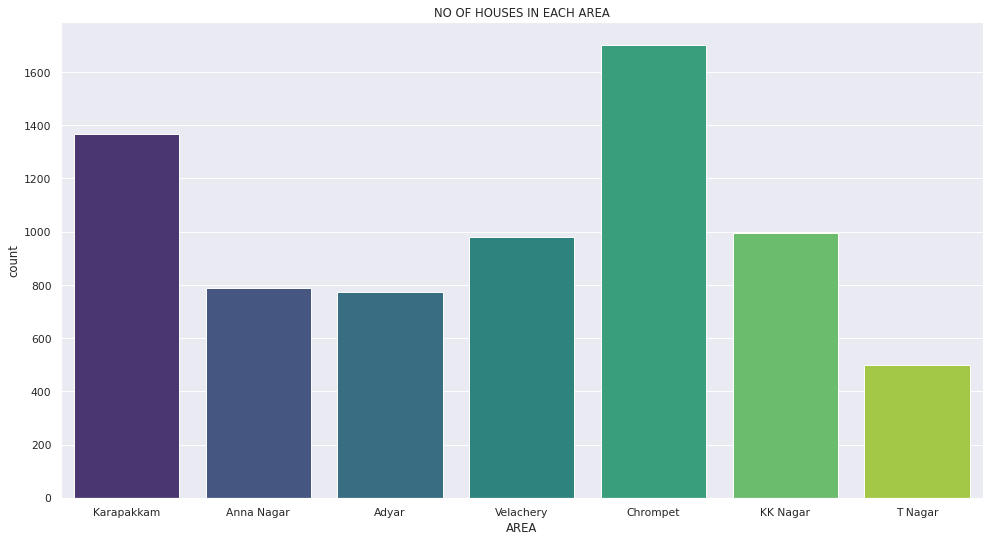

In [355]:
sns.countplot(data=df,x='AREA',palette='viridis');
plt.title('NO OF HOUSES IN EACH AREA')
plt.show()

Text(0.5, 1.0, 'AREA v/s SALES PRICE')

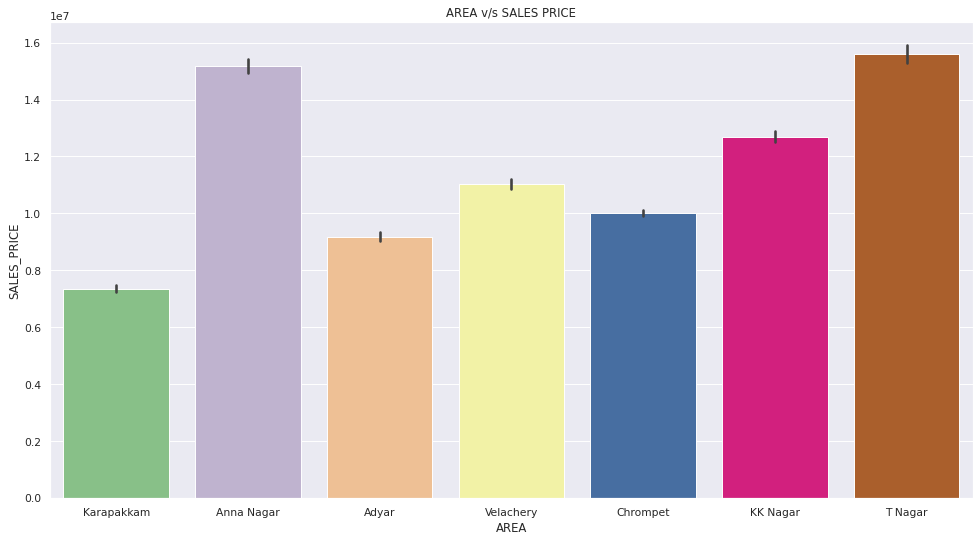

In [356]:
sns.barplot(data=df,x = 'AREA',y="SALES_PRICE",palette='Accent');
plt.title('AREA v/s SALES PRICE')

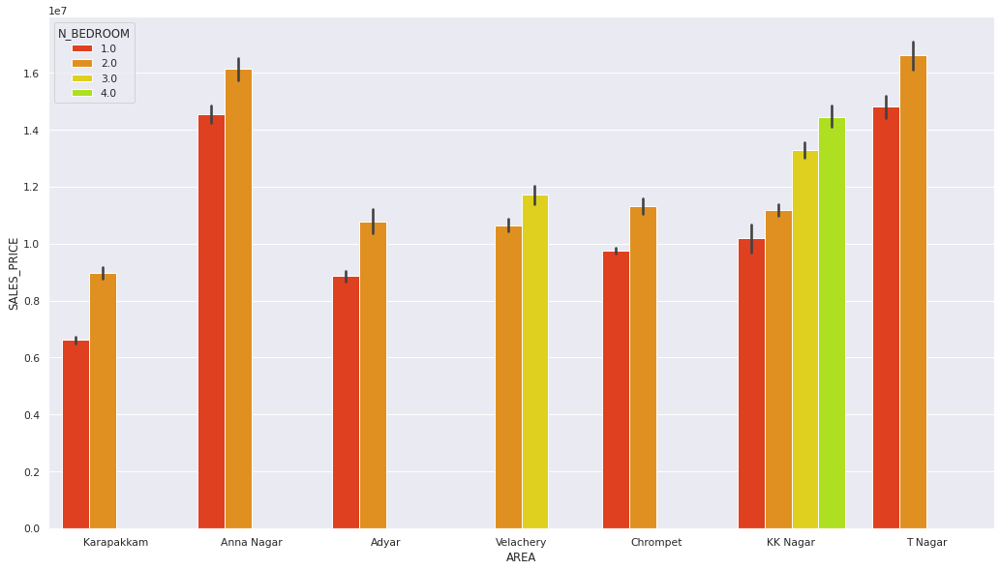

In [357]:
plt.figure(figsize=(18,10))
sns.barplot(data=df,x = 'AREA',y="SALES_PRICE",hue='N_BEDROOM',palette='prism')

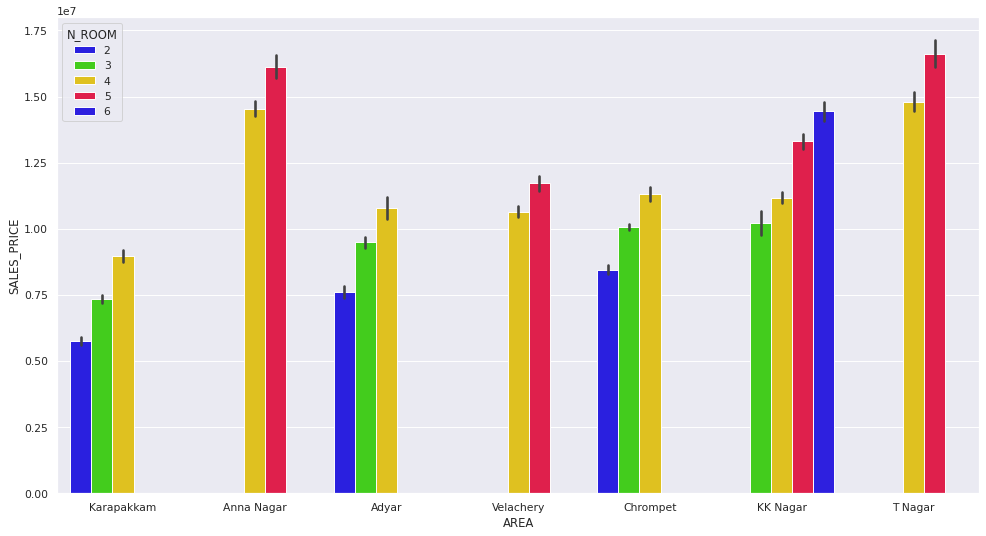

In [358]:
sns.barplot(data=df,x = 'AREA',y="SALES_PRICE",hue='N_ROOM',palette='prism')

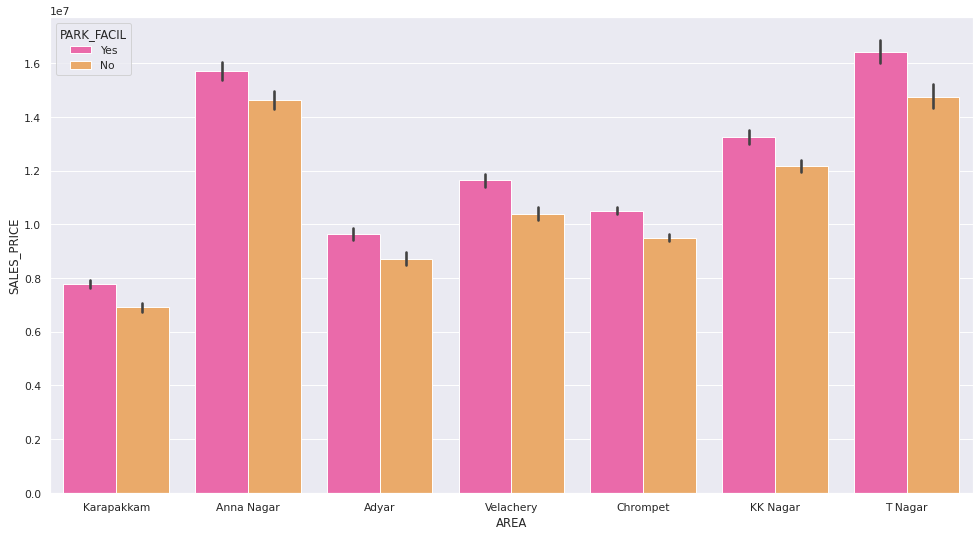

In [359]:
sns.barplot(data=df,x = 'AREA',y="SALES_PRICE",hue='PARK_FACIL',palette='spring')

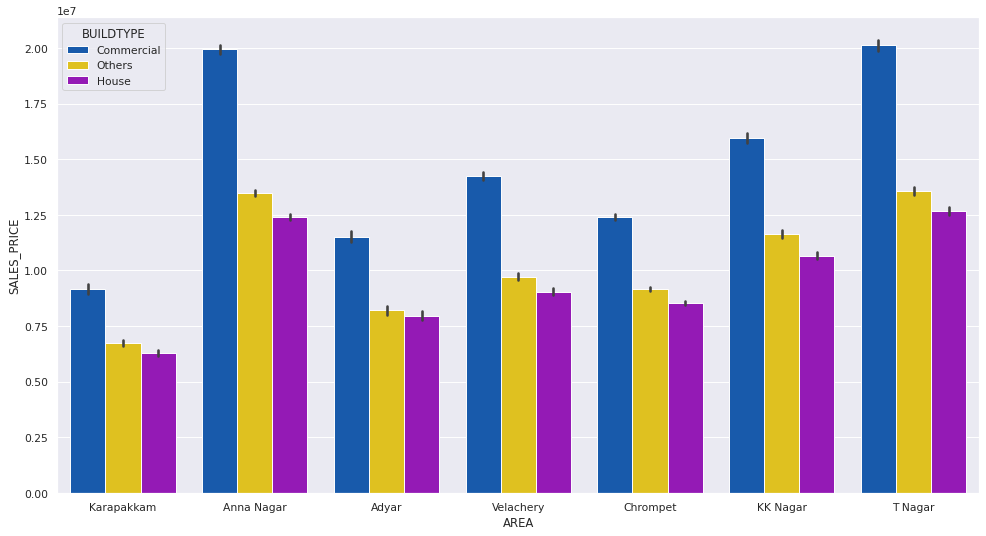

In [360]:
sns.barplot(data=df,x = 'AREA',y="SALES_PRICE",hue='BUILDTYPE',palette='prism')

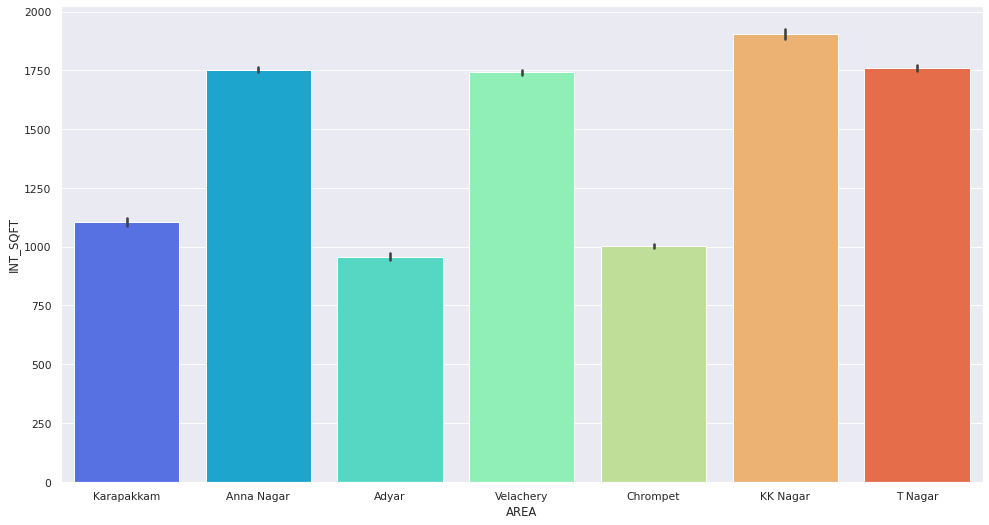

In [361]:
sns.barplot(data=df,x = 'AREA',y='INT_SQFT',palette='rainbow')

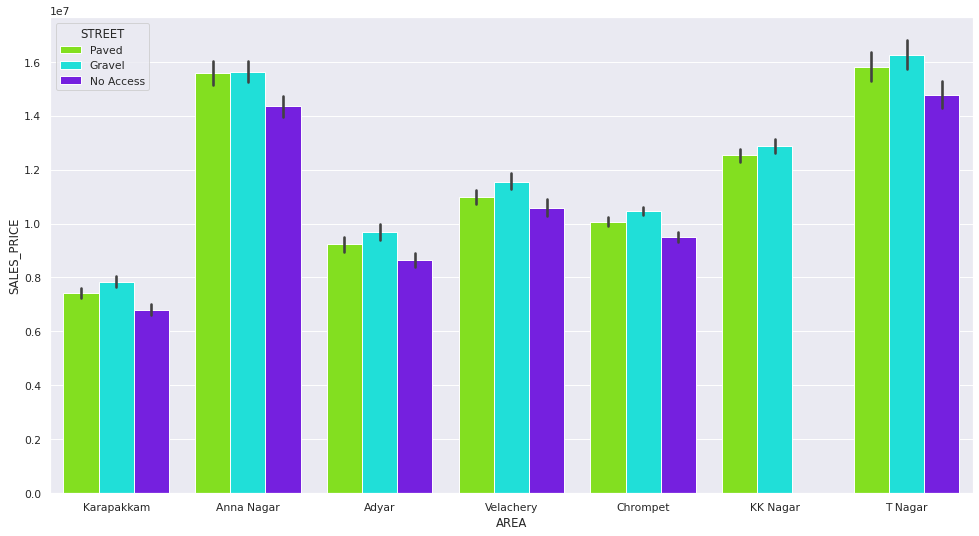

In [362]:
sns.barplot(data=df,x = 'AREA',y="SALES_PRICE",hue='STREET',palette='hsv')

In [363]:
df.keys()

Index(['AREA', 'INT_SQFT', 'DATE_SALE', 'DIST_MAINROAD', 'N_BEDROOM',
       'N_BATHROOM', 'N_ROOM', 'SALE_COND', 'PARK_FACIL', 'DATE_BUILD',
       'BUILDTYPE', 'UTILITY_AVAIL', 'STREET', 'MZZONE', 'QS_ROOMS',
       'QS_BATHROOM', 'QS_BEDROOM', 'QS_OVERALL', 'SALES_PRICE', 'BUILD_YEAR',
       'SALE_YEAR'],
      dtype='object')

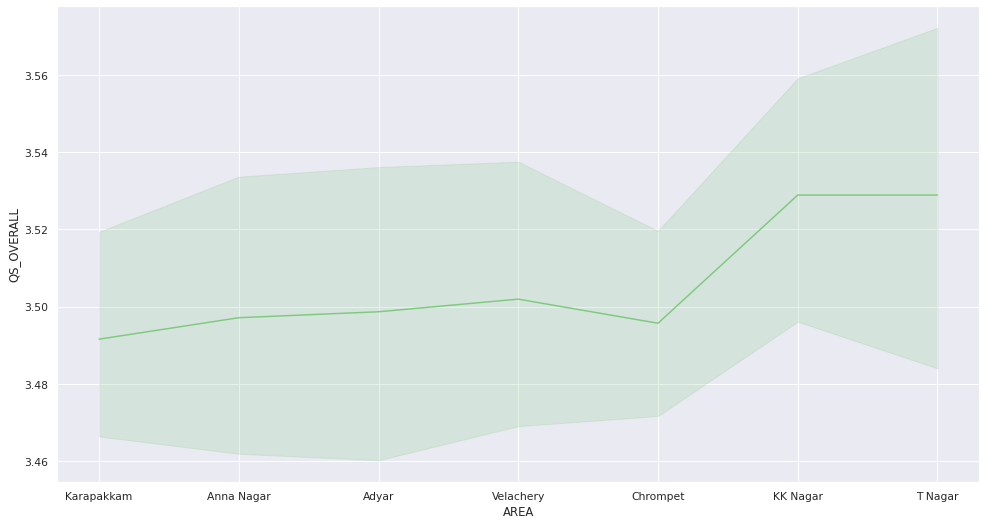

In [364]:
sns.lineplot(data= df,x= 'AREA',y='QS_OVERALL')

From above analysis we understand following points

1.Chrompet and karapakkam have more no. of houses as compared to other areas.

2.Price of houses are higher in T nagar followed by anna nagar.

3.Floor area in sqft. is more in KK nagar. Velachery,T nagar and anna nagr have houses of same areas which is less than kk nagar.

4 . Commercial type of building getting more price than houses in all localities. Anna nagar and T nagar has highest price for Commercial type of buildings.


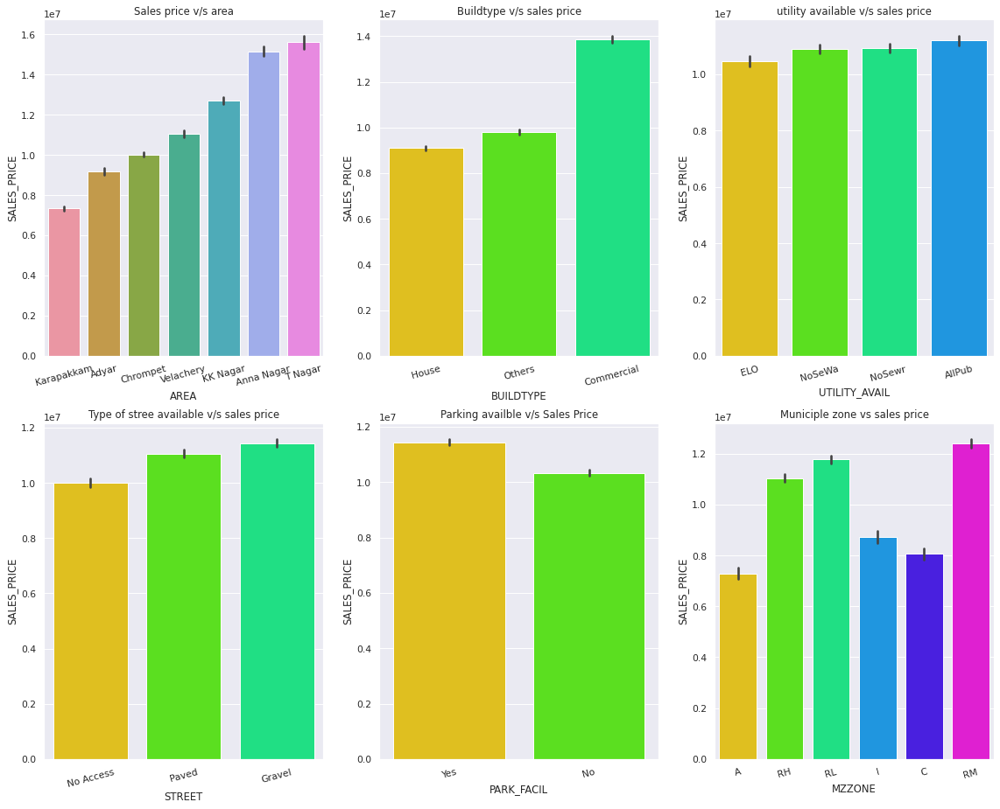

In [365]:
sns.set_theme(style="darkgrid",palette="hsv")
plt.figure(figsize=(20,16))
plt.subplot(231)
sns.barplot(x='AREA',y='SALES_PRICE',data=df,order=df.groupby('AREA')['SALES_PRICE'].mean().reset_index().sort_values('SALES_PRICE')['AREA'])
plt.xticks(rotation=15)
plt.title('Sales price v/s area')
plt.subplot(232)
sns.barplot(x='BUILDTYPE',y='SALES_PRICE',data=df,order=df.groupby('BUILDTYPE')['SALES_PRICE'].mean().reset_index().sort_values('SALES_PRICE')['BUILDTYPE'])
plt.xticks(rotation=15)
plt.title('Buildtype v/s sales price')
plt.subplot(233)
sns.barplot(x='UTILITY_AVAIL',y='SALES_PRICE',data=df,order=df.groupby('UTILITY_AVAIL')['SALES_PRICE'].mean().reset_index().sort_values('SALES_PRICE')['UTILITY_AVAIL'])
plt.xticks(rotation=15)
plt.title('utility available v/s sales price')
plt.subplot(234)
sns.barplot(x='STREET',y='SALES_PRICE',data=df,order=df.groupby('STREET')['SALES_PRICE'].mean().reset_index().sort_values('SALES_PRICE')['STREET'])
plt.xticks(rotation=15)
plt.title('Type of stree available v/s sales price')
plt.subplot(235)
sns.barplot(x='PARK_FACIL',y='SALES_PRICE',data=df)
plt.xticks(rotation=15)
plt.title('Parking availble v/s Sales Price')
plt.subplot(236)
sns.barplot(x='MZZONE',y='SALES_PRICE',data=df)
plt.xticks(rotation=15)
plt.title('Municiple zone vs sales price')
plt.show()

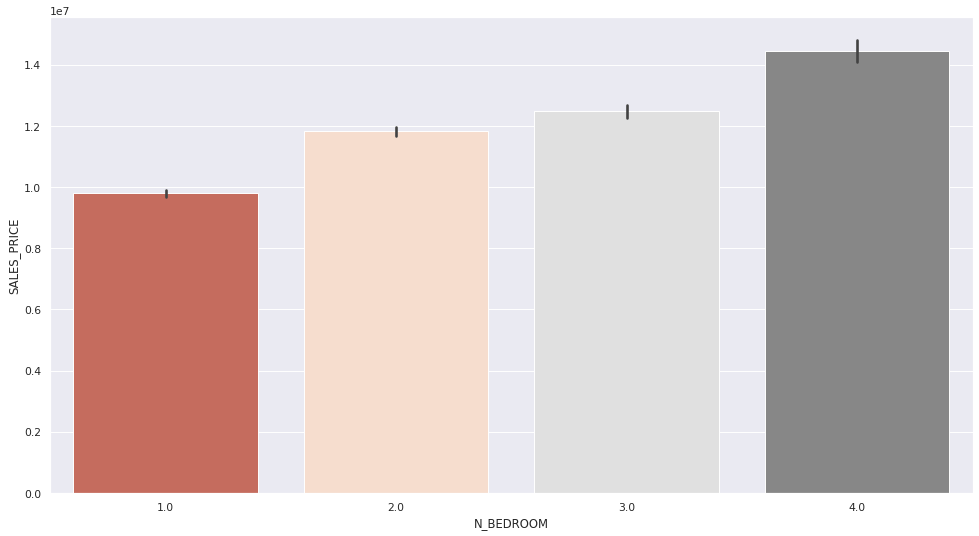

In [366]:
sns.barplot(x='N_BEDROOM',y='SALES_PRICE',data=df,palette = 'RdGy',order=df.groupby('N_BEDROOM')['SALES_PRICE'].mean().reset_index().sort_values('SALES_PRICE')['N_BEDROOM'])

plt.show()

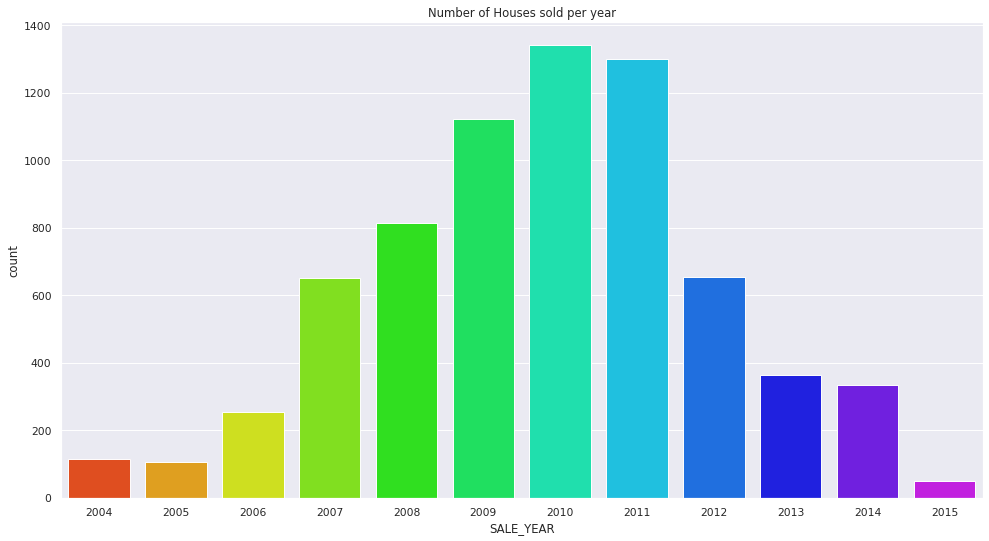

In [367]:
sns.countplot(data=data, x='SALE_YEAR', palette='gist_rainbow')
plt.title("Number of Houses sold per year")
plt.show()

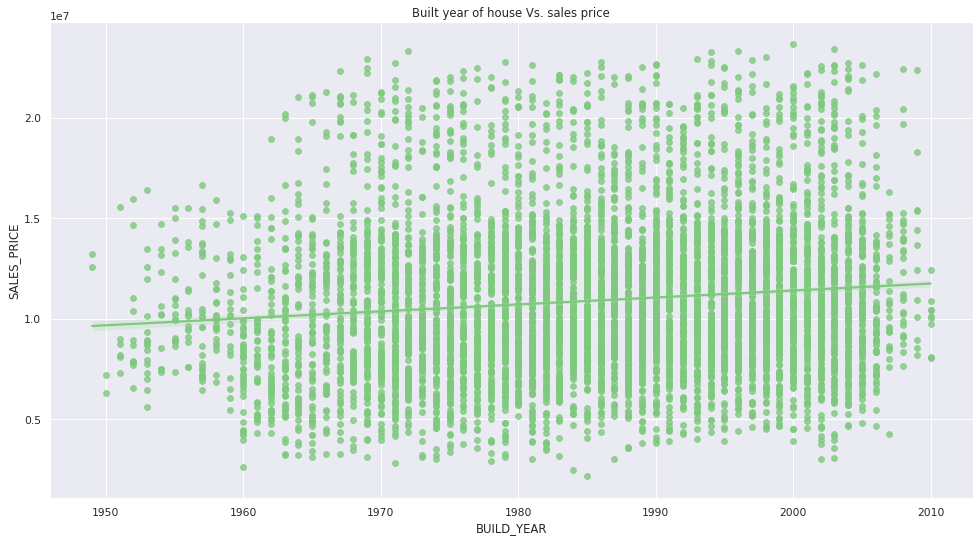

In [368]:
sns.set_palette('Accent')
ax = sns.regplot(data=data, x='BUILD_YEAR', y='SALES_PRICE')
plt.title("Built year of house Vs. sales price")
plt.show()

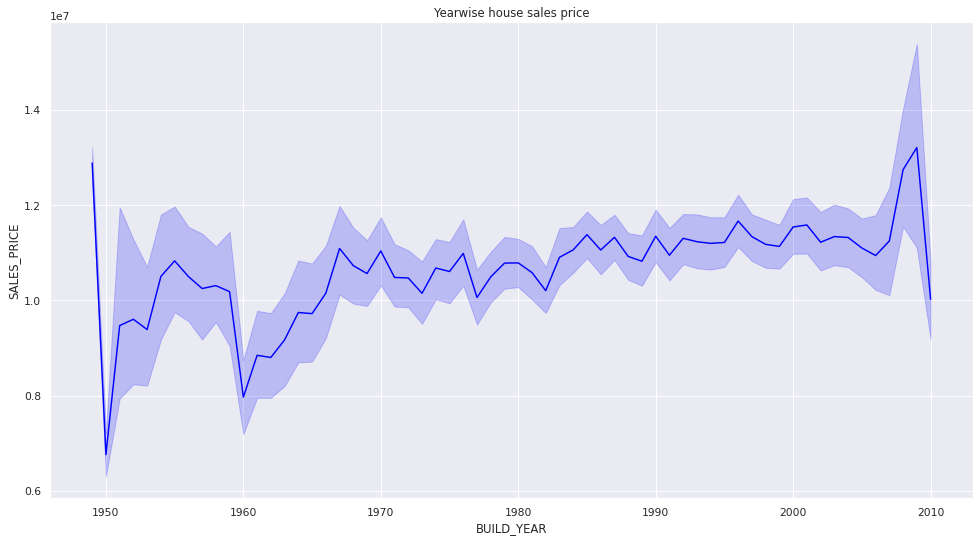

In [369]:
sns.lineplot(data=data, x='BUILD_YEAR', y='SALES_PRICE', color='blue')
plt.title("Yearwise house sales price")
plt.show()

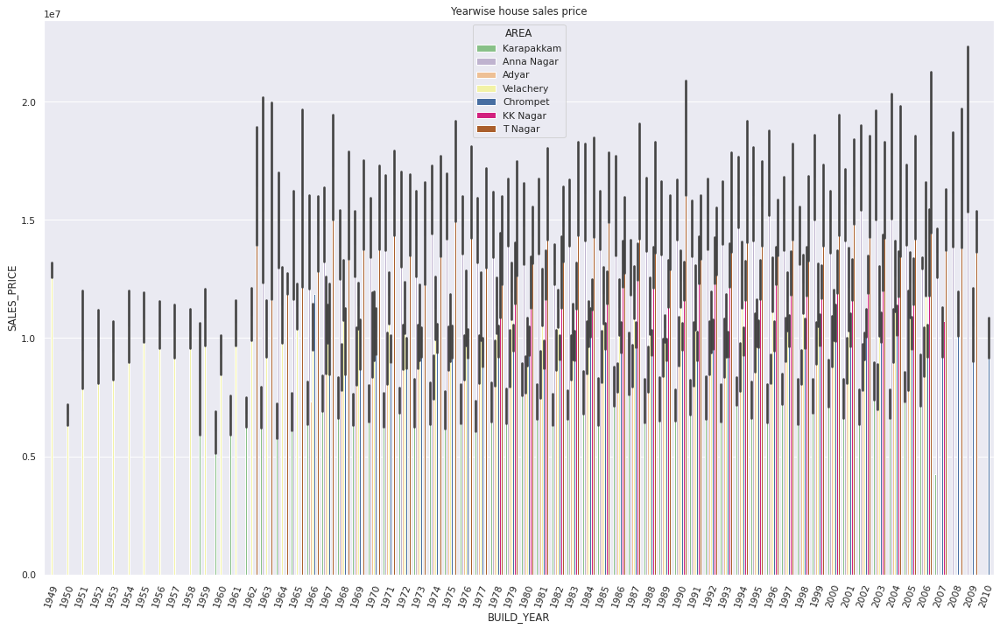

In [370]:
plt.figure(figsize=(20,12))
sns.barplot(data=data, x='BUILD_YEAR', y='SALES_PRICE',hue = 'AREA')
plt.title("Yearwise house sales price")
plt.xticks(rotation=70)
plt.show()

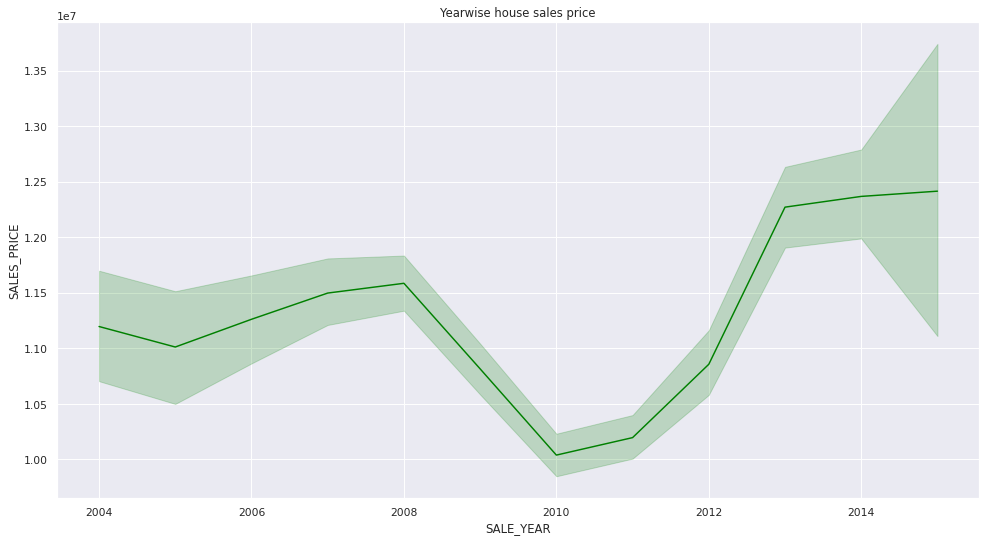

In [372]:
sns.lineplot(data=data, x='SALE_YEAR', y='SALES_PRICE', color='green')
plt.title("Yearwise house sales price")
plt.show()

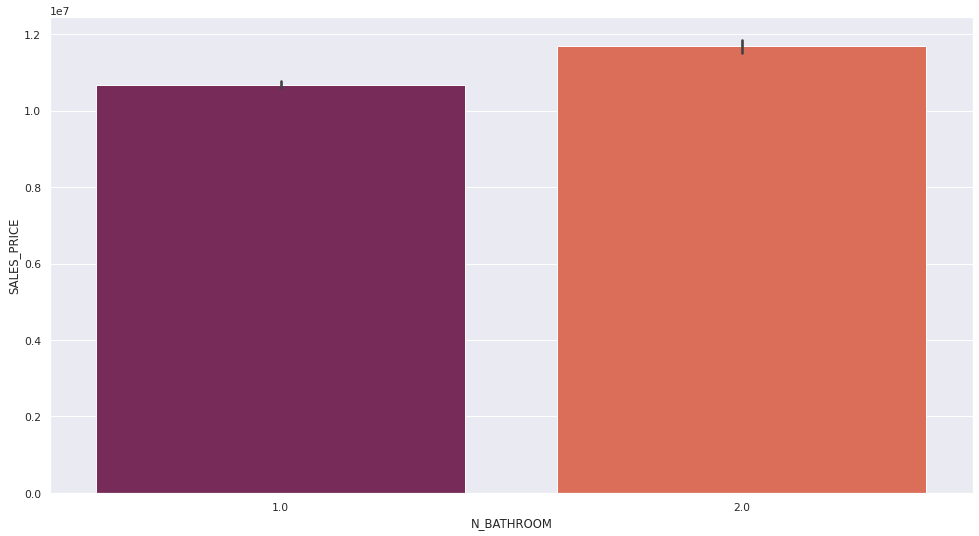

In [373]:
sns.barplot(x='N_BATHROOM',y='SALES_PRICE',data=df,palette = 'rocket',order=df.groupby('N_BATHROOM')['SALES_PRICE'].mean().reset_index().sort_values('SALES_PRICE')['N_BATHROOM'])



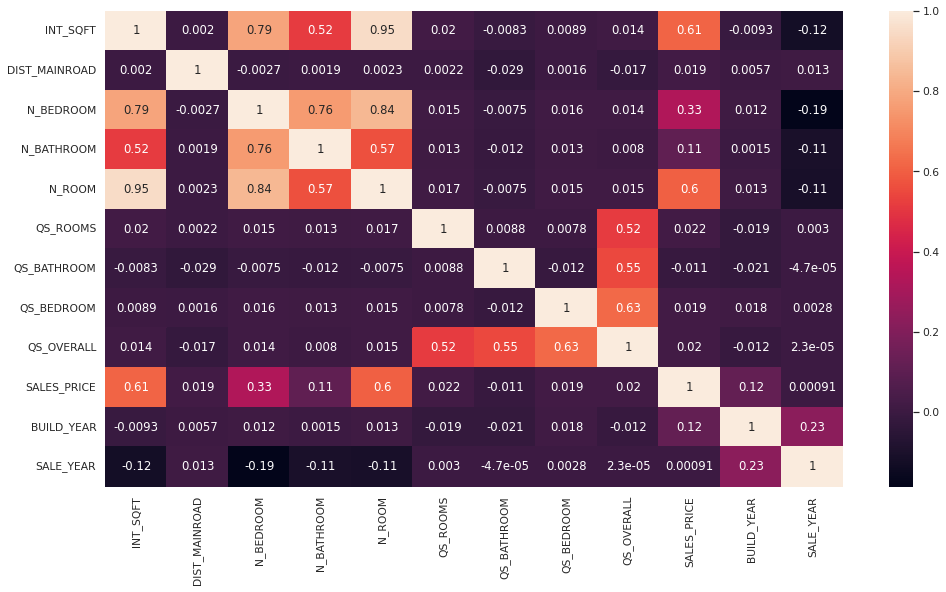

In [374]:
sns.heatmap(df.corr(),annot= True);

<Figure size 1400x1400 with 0 Axes>

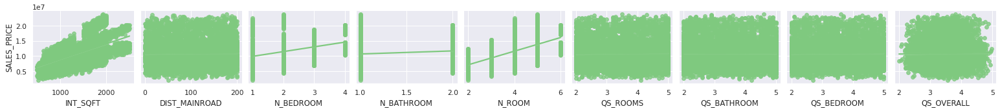

In [375]:
plt.figure(figsize=(20,20))
sns.pairplot(df,x_vars=['INT_SQFT', 'DIST_MAINROAD', 'N_BEDROOM', 'N_BATHROOM', 'N_ROOM','QS_ROOMS', 'QS_BATHROOM', 'QS_BEDROOM', 'QS_OVERALL'],
             y_vars=["SALES_PRICE"],palette='cool',kind="reg")
plt.show()

<Figure size 1190x560 with 0 Axes>

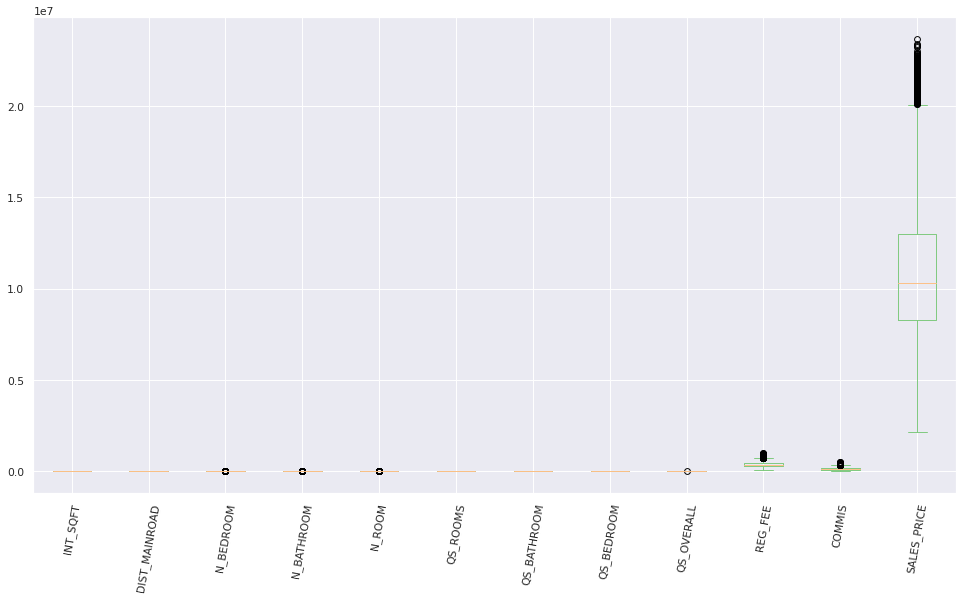

In [376]:
plt.figure(figsize=(17,8))
num_col.plot.box(grid = True);
plt.xticks(rotation =80);
plt.show()

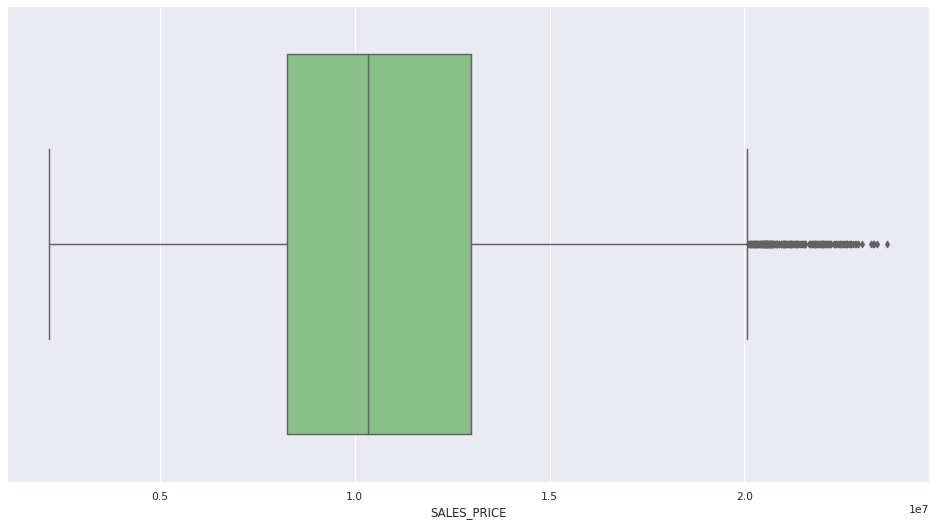

In [377]:
sns.boxplot(df.SALES_PRICE)

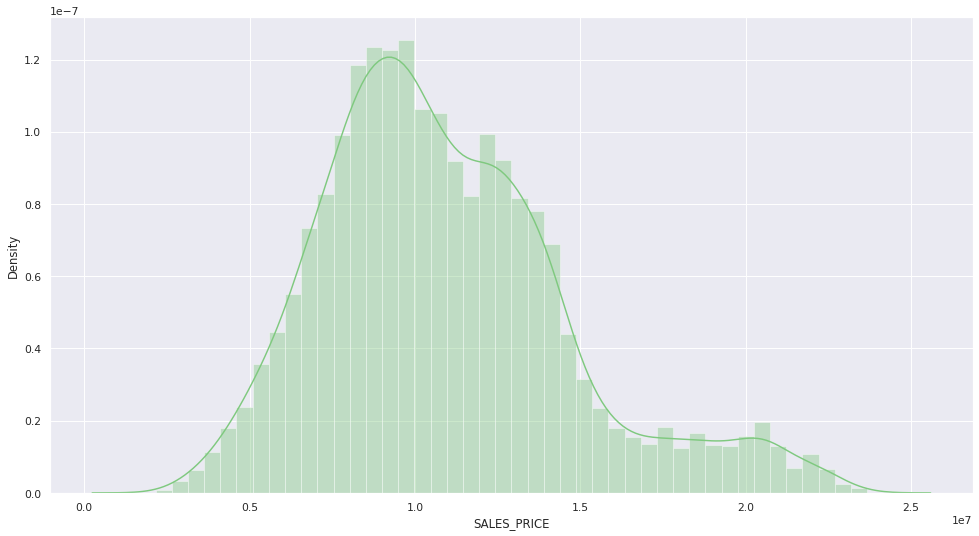

In [378]:
sns.distplot(df.SALES_PRICE)

##### only sales price has outliers but we cant remove these outliers as it it most important column for us

1. T nagar has highest avg ,selling price and karapakkam has lowest avg selling price. so concentration of house is more in area having low price homes.

2. commercial building prices are higher than residential buildings.

3. utilities does not affect too much on sales price. 

4. houses having paved and gravel road around it has little bit costlier.

5. building with parking facility does not affect on sales price too much.

6. RM,RL,RH zones having higher house cost than other zones.

7. More the no. rooms more the price.

8. higher floor area,higher the sales price

### DATA PREPROCESSING

In [379]:
df.keys()

Index(['AREA', 'INT_SQFT', 'DATE_SALE', 'DIST_MAINROAD', 'N_BEDROOM',
       'N_BATHROOM', 'N_ROOM', 'SALE_COND', 'PARK_FACIL', 'DATE_BUILD',
       'BUILDTYPE', 'UTILITY_AVAIL', 'STREET', 'MZZONE', 'QS_ROOMS',
       'QS_BATHROOM', 'QS_BEDROOM', 'QS_OVERALL', 'SALES_PRICE', 'BUILD_YEAR',
       'SALE_YEAR'],
      dtype='object')

In [380]:
from sklearn.preprocessing import LabelEncoder

In [381]:
le = LabelEncoder()

In [382]:
cat_col.keys()

Index(['PRT_ID', 'AREA', 'DATE_SALE', 'SALE_COND', 'PARK_FACIL', 'DATE_BUILD',
       'BUILDTYPE', 'UTILITY_AVAIL', 'STREET', 'MZZONE'],
      dtype='object')

In [383]:
df['PARK_FACIL']=le.fit_transform(df['PARK_FACIL'])
df['AREA']=le.fit_transform(df['AREA'])
df['SALE_COND']=le.fit_transform(df['SALE_COND'])
df['UTILITY_AVAIL']=le.fit_transform(df['UTILITY_AVAIL'])
df['STREET']=le.fit_transform(df['STREET'])
df['MZZONE']=le.fit_transform(df['MZZONE'])

In [384]:
df.shape

(7109, 21)

In [385]:
df.head()

,AREA,INT_SQFT,DATE_SALE,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,DATE_BUILD,BUILDTYPE,UTILITY_AVAIL,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,SALES_PRICE,BUILD_YEAR,SALE_YEAR
0,4,1004,2011-04-05,131,1.0,1.0,3,0,1,1967-05-15,Commercial,0,2,0,4.0,3.9,4.9,4.330,7600000,1967,2011
1,1,1986,2006-12-19,26,2.0,1.0,5,0,0,1995-12-22,Commercial,0,0,3,4.9,4.2,2.5,3.765,21717770,1995,2006
2,0,909,2012-04-02,70,1.0,1.0,3,0,1,1992-09-02,Commercial,1,0,4,4.1,3.8,2.2,3.090,13159200,1992,2012
3,6,1855,2010-03-13,14,3.0,2.0,5,2,0,1988-03-18,Others,3,2,2,4.7,3.9,3.6,4.010,9630290,1988,2010
4,4,1226,2009-05-10,84,1.0,1.0,3,0,1,1979-10-13,Others,0,0,1,3.0,2.5,4.1,3.290,7406250,1979,2009


In [443]:
df.STREET.head()

0    2
1    0
2    0
3    2
4    0
Name: STREET, dtype: int64

#### One Hot Encoding

In [387]:
df = pd.get_dummies(df)

In [388]:
df.head()

,AREA,INT_SQFT,DATE_SALE,DIST_MAINROAD,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,DATE_BUILD,UTILITY_AVAIL,STREET,MZZONE,QS_ROOMS,QS_BATHROOM,QS_BEDROOM,QS_OVERALL,SALES_PRICE,BUILD_YEAR,SALE_YEAR,BUILDTYPE_Commercial,BUILDTYPE_House,BUILDTYPE_Others
0,4,1004,2011-04-05,131,1.0,1.0,3,0,1,1967-05-15,0,2,0,4.0,3.9,4.9,4.330,7600000,1967,2011,1,0,0
1,1,1986,2006-12-19,26,2.0,1.0,5,0,0,1995-12-22,0,0,3,4.9,4.2,2.5,3.765,21717770,1995,2006,1,0,0
2,0,909,2012-04-02,70,1.0,1.0,3,0,1,1992-09-02,1,0,4,4.1,3.8,2.2,3.090,13159200,1992,2012,1,0,0
3,6,1855,2010-03-13,14,3.0,2.0,5,2,0,1988-03-18,3,2,2,4.7,3.9,3.6,4.010,9630290,1988,2010,0,0,1
4,4,1226,2009-05-10,84,1.0,1.0,3,0,1,1979-10-13,0,0,1,3.0,2.5,4.1,3.290,7406250,1979,2009,0,0,1


In [389]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7109 entries, 0 to 7108
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   AREA                  7109 non-null   int64         
 1   INT_SQFT              7109 non-null   int64         
 2   DATE_SALE             7109 non-null   datetime64[ns]
 3   DIST_MAINROAD         7109 non-null   int64         
 4   N_BEDROOM             7109 non-null   float64       
 5   N_BATHROOM            7109 non-null   float64       
 6   N_ROOM                7109 non-null   int64         
 7   SALE_COND             7109 non-null   int64         
 8   PARK_FACIL            7109 non-null   int64         
 9   DATE_BUILD            7109 non-null   datetime64[ns]
 10  UTILITY_AVAIL         7109 non-null   int64         
 11  STREET                7109 non-null   int64         
 12  MZZONE                7109 non-null   int64         
 13  QS_ROOMS          

In [390]:
df.keys()


Index(['AREA', 'INT_SQFT', 'DATE_SALE', 'DIST_MAINROAD', 'N_BEDROOM',
       'N_BATHROOM', 'N_ROOM', 'SALE_COND', 'PARK_FACIL', 'DATE_BUILD',
       'UTILITY_AVAIL', 'STREET', 'MZZONE', 'QS_ROOMS', 'QS_BATHROOM',
       'QS_BEDROOM', 'QS_OVERALL', 'SALES_PRICE', 'BUILD_YEAR', 'SALE_YEAR',
       'BUILDTYPE_Commercial', 'BUILDTYPE_House', 'BUILDTYPE_Others'],
      dtype='object')

In [391]:
#dropping unwanted columns
df.drop(['DATE_SALE','DIST_MAINROAD','DATE_BUILD','QS_ROOMS', 'QS_BATHROOM','QS_BEDROOM', 'QS_OVERALL'],axis=1,inplace =True)

In [392]:
df.head()

,AREA,INT_SQFT,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,UTILITY_AVAIL,STREET,MZZONE,SALES_PRICE,BUILD_YEAR,SALE_YEAR,BUILDTYPE_Commercial,BUILDTYPE_House,BUILDTYPE_Others
0,4,1004,1.0,1.0,3,0,1,0,2,0,7600000,1967,2011,1,0,0
1,1,1986,2.0,1.0,5,0,0,0,0,3,21717770,1995,2006,1,0,0
2,0,909,1.0,1.0,3,0,1,1,0,4,13159200,1992,2012,1,0,0
3,6,1855,3.0,2.0,5,2,0,3,2,2,9630290,1988,2010,0,0,1
4,4,1226,1.0,1.0,3,0,1,0,0,1,7406250,1979,2009,0,0,1


In [393]:
df.shape

(7109, 16)

In [394]:
df.to_csv('chennai_final.csv', index=False)

In [395]:
## importing final dataset
df = pd.read_csv("chennai_final.csv")

In [396]:
df.head()

,AREA,INT_SQFT,N_BEDROOM,N_BATHROOM,N_ROOM,SALE_COND,PARK_FACIL,UTILITY_AVAIL,STREET,MZZONE,SALES_PRICE,BUILD_YEAR,SALE_YEAR,BUILDTYPE_Commercial,BUILDTYPE_House,BUILDTYPE_Others
0,4,1004,1.0,1.0,3,0,1,0,2,0,7600000,1967,2011,1,0,0
1,1,1986,2.0,1.0,5,0,0,0,0,3,21717770,1995,2006,1,0,0
2,0,909,1.0,1.0,3,0,1,1,0,4,13159200,1992,2012,1,0,0
3,6,1855,3.0,2.0,5,2,0,3,2,2,9630290,1988,2010,0,0,1
4,4,1226,1.0,1.0,3,0,1,0,0,1,7406250,1979,2009,0,0,1


In [397]:
df.shape

(7109, 16)

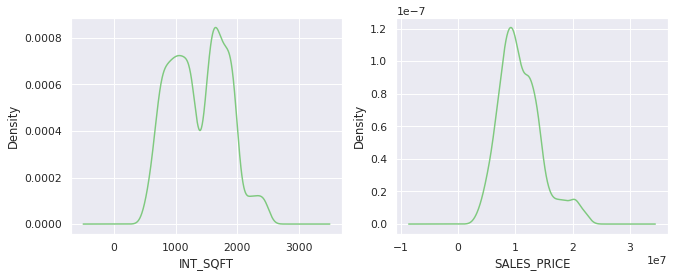

In [398]:
plt.figure()
plt.subplot(231)
plt.xlabel("INT_SQFT")
df.INT_SQFT.plot(kind='kde')
plt.subplot(232)
df.SALES_PRICE.plot(kind='kde')
plt.xlabel('SALES_PRICE')
plt.show()


In [399]:
df['INT_SQFT'] = np.log(df.INT_SQFT)

Text(0.5, 1.0, 'INT_SQFT distribution after log tranceformation')

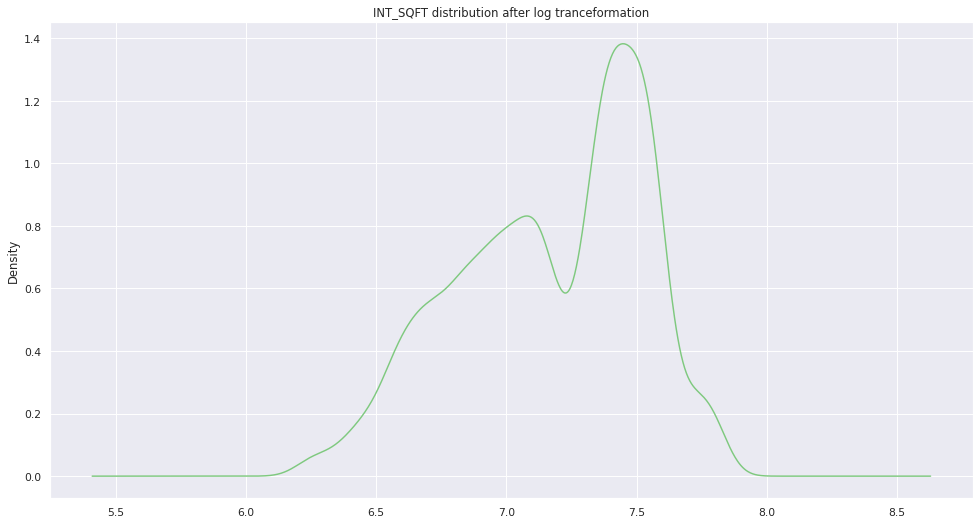

In [400]:
df.INT_SQFT.plot(kind = 'kde') 
plt.title('INT_SQFT distribution after log tranceformation')

After log tranceformation the distribution looks better than before.

# Machine learning part

In [401]:
#from sklearn.model_selection import train_test_split
#from sklearn.linear_model import LinearRegression 
#from sklearn.neighbors import KNeighborsRegressor
#from sklearn.tree import DecisionTreeRegressor
#from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
#from sklearn.preprocessing import StandardScaler
#from sklearn.model_selection import GridSearchCV, cross_val_score, RepeatedKFold
#from sklearn.model_selection import RepeatedStratifiedKFold
#from sklearn import metrics

### Tain test split

In [402]:
from sklearn.model_selection import train_test_split

In [403]:
X = df.drop(['SALES_PRICE'],axis = 1)

In [404]:
y = df.SALES_PRICE

In [405]:
X_train,X_test,y_train,y_test = train_test_split(X,y,shuffle = True, random_state =45,test_size=0.2)

### Feature Scaling
 we use this method to normalize the range of independent variables or features of data.

In [406]:
from sklearn.preprocessing import StandardScaler


In [407]:
scl = StandardScaler()

In [408]:
X_train =scl.fit_transform(X_train)
X_test = scl.transform(X_test)

## Model 1 Simple linear regression

In [409]:
from sklearn.linear_model import LinearRegression

In [410]:
lr = LinearRegression().fit(X_train,y_train)


In [411]:
y_pred =lr.predict(X_test)

Evaluation metrics for linear regression

In [412]:
from sklearn import metrics

In [413]:
lr_score = metrics.r2_score(y_test,y_pred)
lr_mae = metrics.mean_absolute_error(y_test,y_pred)

In [414]:
print("Score on train data: {:.2f}".format(lr.score(X_train, y_train)))
print("Score on Train data: {:.2f}".format(lr.score(X_test, y_test)))
print("R2 score: {:.2f}".format(metrics.r2_score(y_test, y_pred)))
print("MSE: {:.2f}".format(metrics.mean_squared_error(y_test, y_pred)))
print("MAE: {:.2f}".format(metrics.mean_absolute_error(y_test, y_pred)))

Score on train data: 0.89
Score on Train data: 0.89
R2 score: 0.89
MSE: 1556877282131.51
MAE: 953585.88


In [415]:
lr_prediction = pd.DataFrame({
    'actual':y_test,
    'predicted':y_pred.flatten()
})

lr_prediction.head()

,actual,predicted
4792,9689125,9.804515e+06
3229,8604850,9.442327e+06
2656,7099500,5.549460e+06
862,5999250,7.010646e+06
1387,13791820,1.339301e+07


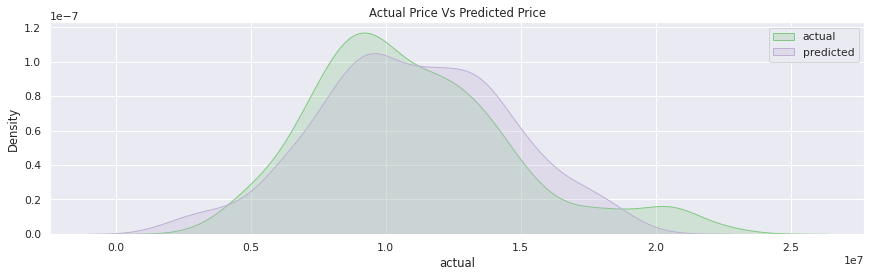

In [416]:
plt.figure(figsize=(15,4))
sns.kdeplot(data=lr_prediction, x='actual', label='actual', shade=True)
sns.kdeplot(data=lr_prediction, x='predicted', label='predicted', shade=True)
plt.title("Actual Price Vs Predicted Price")
plt.legend()
plt.show()

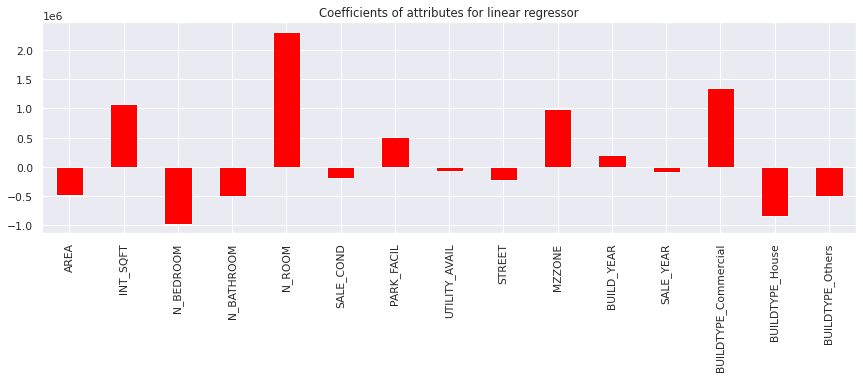

In [417]:
# coefficients
lr_coefficient = pd.Series(lr.coef_, index=X.columns.tolist())

plt.figure(figsize=(15, 4))
lr_coefficient.plot(kind='bar', color=['red'])
plt.title("Coefficients of attributes for linear regressor")
plt.show()


### KNN Regressor

In [418]:
from sklearn.neighbors import KNeighborsRegressor

In [419]:
knn_reg = KNeighborsRegressor().fit(X_train,y_train)

In [420]:
knn_pred = knn_reg.predict(X_test)

In [421]:
print("KNN regressor train score: {:.2f}".format(knn_reg.score(X_train, y_train)))
print("KNN regressor test score: {:.2f}".format(knn_reg.score(X_test, y_test)))

KNN regressor train score: 0.95
KNN regressor test score: 0.93


### Cross validation for knn regression

In [422]:
from sklearn.model_selection import GridSearchCV, cross_val_score, RepeatedKFold

In [423]:
# Cross validation of knn

knn_search = GridSearchCV(estimator=KNeighborsRegressor(), param_grid=dict(n_neighbors=[2,5,10,15,20,24,25,28,30,]), cv=3)

knn_search.fit(X,y)

print("Best parameter:", knn_search.best_params_)
print("Best score: ",knn_search.best_score_)

Best parameter: {'n_neighbors': 5}
Best score:  0.5990783363854141


In [424]:
knn_regressor = KNeighborsRegressor(n_neighbors=5).fit(X_train, y_train)

knn_ypred = knn_regressor.predict(X_test)

knn_score = metrics.r2_score(y_test, knn_ypred)
knn_mae = metrics.mean_absolute_error(y_test, knn_ypred)

print("KNN regressor train score: {:.2f}".format(knn_regressor.score(X_train, y_train)))
print("KNN regressor test score: {:.2f}".format(knn_regressor.score(X_test, y_test)))
print("KNN r2 score: {:.2f}".format(knn_score))

KNN regressor train score: 0.95
KNN regressor test score: 0.93
KNN r2 score: 0.93


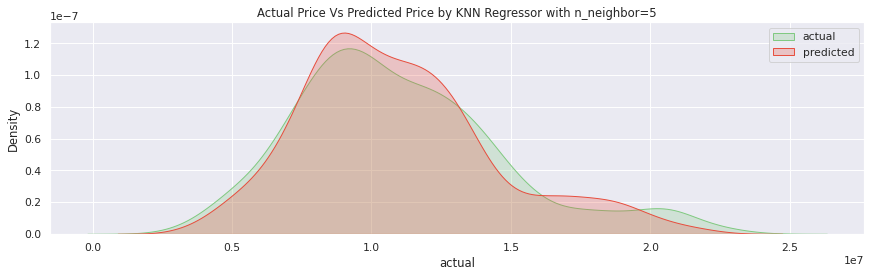

In [425]:
knn_prediction = pd.DataFrame({
    'actual':y_test,
    'predicted': knn_ypred.flatten()
})


plt.figure(figsize=(15,4))
sns.kdeplot(data=knn_prediction, x='actual', label='actual', shade=True)
sns.kdeplot(data=knn_prediction, x='predicted', label='predicted', color='#e74c3c', shade=True)
plt.title("Actual Price Vs Predicted Price by KNN Regressor with n_neighbor=5")
plt.legend()
plt.show()

### Decision Tree Regressor

In [426]:
from sklearn.tree import DecisionTreeRegressor

In [427]:
dt_regressor = DecisionTreeRegressor(max_depth=8).fit(X_train, y_train)

dt_y_predict = dt_regressor.predict(X_test)

In [428]:
# score
dt_score = metrics.r2_score(y_test, dt_y_predict)
dt_mae = metrics.mean_absolute_error(y_test, dt_y_predict)

print("DT Training score: {:.2f}".format(dt_regressor.score(X_train, y_train)))
print("DT Test score: {:.2f}".format(dt_regressor.score(X_test, y_test)))

print("")
print("DT R2 score: {:.2f}".format(metrics.r2_score(y_test, dt_y_predict)))
print("DT MSE: {:.2f}".format(metrics.mean_squared_error(y_test, dt_y_predict)))
print("DT MAE: {:.2f}".format(metrics.mean_absolute_error(y_test, dt_y_predict)))

DT Training score: 0.97
DT Test score: 0.96

DT R2 score: 0.96
DT MSE: 609972745673.29
DT MAE: 628793.05


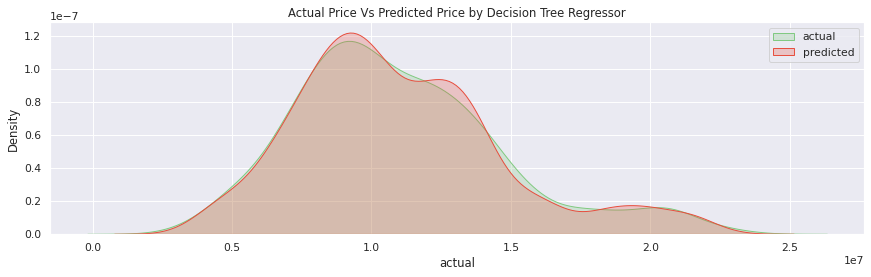

In [429]:
dt_prediction = pd.DataFrame({
    'actual':y_test,
    'predicted': dt_y_predict.flatten()
})


plt.figure(figsize=(15,4))
sns.kdeplot(data=dt_prediction, x='actual', label='actual', shade=True)
sns.kdeplot(data=dt_prediction, x='predicted', label='predicted', color='#e74c3c', shade=True)
plt.title("Actual Price Vs Predicted Price by Decision Tree Regressor")
plt.legend()
plt.show()

In [430]:
dt_coefficient = pd.Series(dt_regressor.feature_importances_, index=X.columns.tolist())


In [431]:
dt_coefficient.sort_values(ascending=False)


INT_SQFT                0.398783
BUILDTYPE_Commercial    0.322450
MZZONE                  0.115356
AREA                    0.109853
N_BEDROOM               0.020819
PARK_FACIL              0.014244
N_BATHROOM              0.008152
STREET                  0.005056
BUILDTYPE_Others        0.003416
BUILD_YEAR              0.000960
BUILDTYPE_House         0.000350
N_ROOM                  0.000327
SALE_COND               0.000129
SALE_YEAR               0.000094
UTILITY_AVAIL           0.000009
dtype: float64

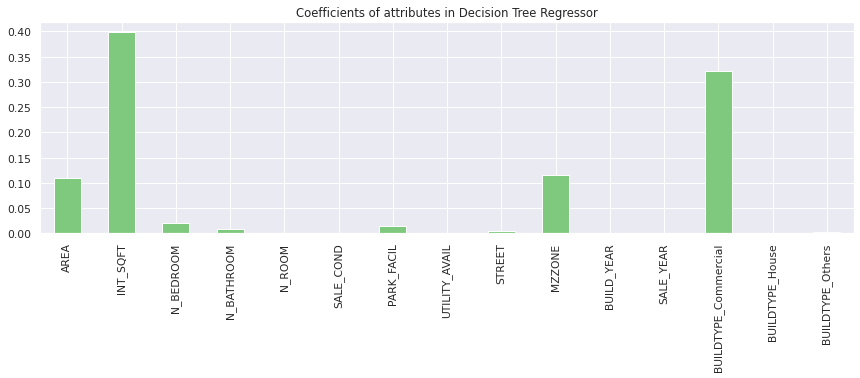

In [432]:
# coefficients

plt.figure(figsize=(15, 4))
dt_coefficient.plot(kind='bar')
plt.title("Coefficients of attributes in Decision Tree Regressor")
plt.show()

### Random Forest Regressor

In [433]:
from sklearn.ensemble import RandomForestRegressor

In [434]:
rf_regressor = RandomForestRegressor(random_state=0).fit(X_train, y_train)

rf_y_predict = rf_regressor.predict(X_test)


# score
print("RF Training score: {:.2f}".format(rf_regressor.score(X_train, y_train)))
print("RF Test score: {:.2f}".format(rf_regressor.score(X_test, y_test)))


print("")
print("RF R2 score: {:.2f}".format(metrics.r2_score(y_test, rf_y_predict)))
print("RF MSE: {:.2f}".format(metrics.mean_squared_error(y_test, rf_y_predict)))
print("RF MAE: {:.2f}".format(metrics.mean_absolute_error(y_test, rf_y_predict)))

RF Training score: 1.00
RF Test score: 0.99

RF R2 score: 0.99
RF MSE: 198079464582.74
RF MAE: 351182.61


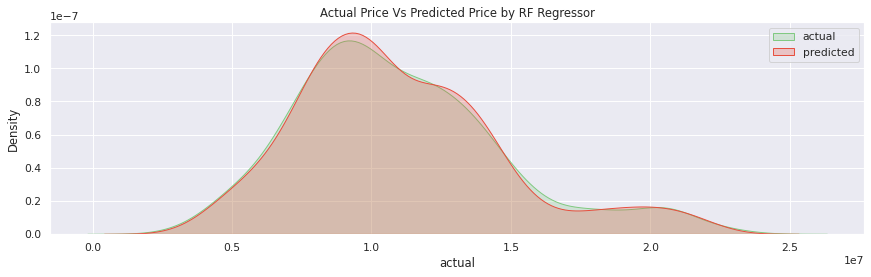

In [435]:


rf_prediction = pd.DataFrame({
    'actual':y_test,
    'predicted': rf_y_predict.flatten()
})


plt.figure(figsize=(15,4))
sns.kdeplot(data=rf_prediction, x='actual', label='actual', shade=True)
sns.kdeplot(data=rf_prediction, x='predicted', label='predicted', color='#e74c3c', shade=True)
plt.title("Actual Price Vs Predicted Price by RF Regressor")
plt.legend()
plt.show()

#### Cross validation of random forest regressor

In [436]:
rf_search = GridSearchCV(
    estimator=RandomForestRegressor(),
    param_grid={
        'max_depth': range(5,10),
        'n_estimators': (90,100),
        'random_state': [0,20,30]
    },
    cv=5,
    scoring='neg_mean_squared_error',
    verbose=0,
    n_jobs=-1
)

grid_result = rf_search.fit(X,y)

In [437]:

print("Best estimator for RF: {}".format(grid_result.best_estimator_))


Best estimator for RF: RandomForestRegressor(max_depth=9, random_state=20)


In [438]:
# initiating the model with best estimators
rf_regressor = RandomForestRegressor(max_depth=9, n_estimators=100, random_state=0)
# fit the model with training data
rf_regressor.fit(X_train, y_train)
# predict on X_test
rf_y_predict = rf_regressor.predict(X_test)

# score
rf_score = metrics.r2_score(y_test, rf_y_predict)
rf_mae = metrics.mean_absolute_error(y_test, rf_y_predict)

print("RF Training score: {:.2f}".format(rf_regressor.score(X_train, y_train)))
print("RF Test score: {:.2f}".format(rf_regressor.score(X_test, y_test)))


print("")
print("RF R2 score: {:.2f}".format(metrics.r2_score(y_test, rf_y_predict)))
print("RF MSE: {:.2f}".format(metrics.mean_squared_error(y_test, rf_y_predict)))
print("RF MAE: {:.2f}".format(metrics.mean_absolute_error(y_test, rf_y_predict)))

RF Training score: 0.99
RF Test score: 0.98

RF R2 score: 0.98
RF MSE: 301853156030.73
RF MAE: 443009.10


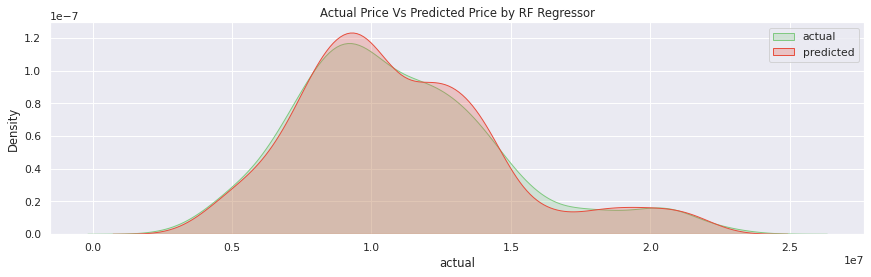

In [439]:
rf_prediction = pd.DataFrame({
    'actual':y_test,
    'predicted': rf_y_predict.flatten()
})


plt.figure(figsize=(15,4))
sns.kdeplot(data=rf_prediction, x='actual', label='actual', shade=True)
sns.kdeplot(data=rf_prediction, x='predicted', label='predicted', color='#e74c3c', shade=True)
plt.title("Actual Price Vs Predicted Price by RF Regressor")
plt.legend()
plt.show()

In [440]:
# coefficients of random forest
rf_coefficient = pd.Series(rf_regressor.feature_importances_, index=X.columns.tolist())

rf_coefficient.sort_values(ascending=False)

INT_SQFT                0.403556
BUILDTYPE_Commercial    0.315299
MZZONE                  0.120583
AREA                    0.086641
N_BEDROOM               0.030358
PARK_FACIL              0.014092
N_BATHROOM              0.008170
STREET                  0.005903
N_ROOM                  0.005893
BUILD_YEAR              0.002993
BUILDTYPE_House         0.002228
BUILDTYPE_Others        0.001958
SALE_COND               0.000979
SALE_YEAR               0.000858
UTILITY_AVAIL           0.000491
dtype: float64

## Model comparison

In [441]:
models_df = pd.DataFrame({
    'model': "Linear KNN DecisionTree RandomForerst".split(),
    'r2_score': [lr_score, knn_score, dt_score, rf_score,],
    'mae': [lr_mae, knn_mae, dt_mae, rf_mae ]
})

models_df

,model,r2_score,mae
0,Linear,0.892053,953585.884053
1,KNN,0.928849,730013.936709
2,DecisionTree,0.957707,628793.052254
3,RandomForerst,0.979071,443009.102439


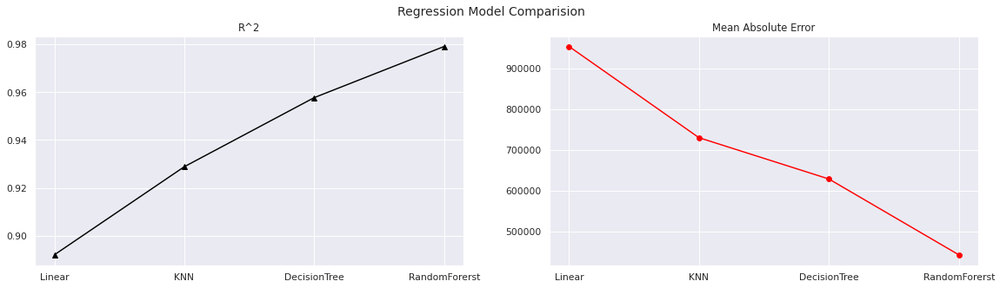

In [442]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,5))
fig.suptitle("Regression Model Comparision")
ax[0].plot(models_df.model, models_df.r2_score, color='black', marker='^')
ax[0].set_title("R^2")
ax[1].plot(models_df.model, models_df.mae, color='r', marker='o')
ax[1].set_title("Mean Absolute Error")
plt.show()